# Analiza postów i komentarzy dotyczących branży fitness

In [ ]:
#instalacja biblotek
!pip install wordcloud
import pandas as pd
import pytz
import re
from tqdm import tqdm
import random
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings
warnings.filterwarnings('ignore')

import nltk
from nltk.corpus import stopwords

# Pobranie listy stop words z biblioteki NLTK
nltk.download('stopwords') 
stop_words = set(stopwords.words('english'))

Załadowanie danych

In [11]:
df = pd.read_csv(r'C:\Users\mplucinska\PycharmProjects\pythonProject\data.csv').iloc[:, :12]
data = df.copy()
data.datetime = pd.to_datetime(data.datetime)
data.text = data.text.astype(str)
data.title = data.title.astype(str)

# first 12 rows
print(data.head(12))


    register_index  post_id comment_id               author  \
0   146ozvujnrwkzy  146ozvu    jnrwkzy         mackydoodles   
1   146ozvujnsjbq4  146ozvu    jnsjbq4  shelf_actualization   
2   146ozvujnsqa6h  146ozvu    jnsqa6h  shelf_actualization   
3   145tbt7jnnfw9c  145tbt7    jnnfw9c        cinnamond0nut   
4   1443xptjnj6mg1  1443xpt    jnj6mg1  shelf_actualization   
5   1443xhgjndtm15  1443xhg    jndtm15      RVA_Firefighter   
6   1437xsvjngc9rk  1437xsv    jngc9rk  shelf_actualization   
7   1437xsvjn9698t  1437xsv    jn9698t       sex_officialll   
8   1437xsvjn8zk6x  1437xsv    jn8zk6x         StoneFlySoul   
9   1437xsvjnkjgso  1437xsv    jnkjgso      Chemically-Sane   
10  1437xsvjn9s1ka  1437xsv    jn9s1ka              Shazvox   
11  1437xsvjn8zg6t  1437xsv    jn8zg6t     digitalquesarito   

              datetime title  url  score  comments  \
0  2023-06-11 12:56:52   nan  NaN    1.0       NaN   
1  2023-06-11 15:54:33   nan  NaN    1.0       NaN   
2  2023-06-11 16:4

### Funkcja przeprowadzającą podstawową analizę danych. 
Funkcja ta generuje i drukuje podstawowe statystyki opisowe dla danych liczbowych w DataFrame'ie a także sprawdza i drukuje liczbę brakujących wartości w każdej kolumnie DataFrame'u.

In [12]:
def initial_data_analysis(df):
    basic_stats = df.describe()
    print("Basic data statistics:")
    print(basic_stats)

    missing_data = df.isnull().sum()
    print("\nMissing data:")
    print(missing_data)

initial_data_analysis(df)


Basic data statistics:
               score     comments  author_post_karma
count  338156.000000  1114.000000       3.396500e+04
mean        4.576926   368.864452       5.191819e+04
std        25.154017   305.685723       9.850929e+04
min      -351.000000     0.000000      -1.000000e+02
25%         1.000000   100.000000       1.837000e+03
50%         2.000000   332.000000       1.332500e+04
75%         3.000000   543.500000       6.174700e+04
max      8107.000000  1609.000000       1.286465e+06

Missing data:
register_index            0
post_id                   0
comment_id             1114
author                    0
datetime                  0
title                337042
url                  337042
score                     0
comments             337042
text                      3
author_post_karma    304191
tag                   47474
dtype: int64


### Funkcja normalization_and_transformation 
Służy do normalizacji i przekształcenia tekstu znajdującego się w wybranej kolumnie DataFrame'u. Wymaga trzech parametrów: DataFrame'u, nazwy głównej kolumny do normalizacji oraz nazwy kolumny pomocniczej, która zawiera tekst do zastąpienia pustych wartości w głównej kolumnie. Proces normalizacji obejmuje kilka kroków. Najpierw, jeśli wartość w głównej kolumnie jest pusta, jest ona zastępowana odpowiednią wartością z kolumny pomocniczej. Następnie cały tekst jest zamieniany na małe litery. Usuwane są znaczniki @username oraz znaczniki hashtagów. Linki URL są również usuwane z tekstu. Tekst jest następnie tokenizowany, czyli dzielony na poszczególne słowa. Po tokenizacji stosowany jest proces stemmingu, który redukuje słowa do ich podstawowych form. Na koniec, usuwane są pojedyncze znaki alfabetyczne, które mogą pozostać po procesie stemmingu. Ta funkcja jest użyteczna do przygotowania danych tekstowych przed dalszą analizą lub przetwarzaniem.

In [13]:
def normalization_and_transformation(df, main_col, alt_col):
    df[main_col] = df.apply(lambda x: x[alt_col] if x[main_col] == '' else x[main_col], axis=1)

    df[main_col] = df[main_col].str.lower()

    df[main_col] = df[main_col].apply(lambda x: re.sub('@[^\s]+', '', x))

    df[main_col] = df[main_col].apply(lambda x: re.sub(r'\B#\S+', '', x))

    df[main_col] = df[main_col].apply(lambda x: re.sub(r"http\S+", "", x))

    df[main_col] = df[main_col].apply(word_tokenize)

    ps = PorterStemmer()

    df[main_col] = df[main_col].apply(lambda words: [ps.stem(word) for word in words])

    df[main_col] = df[main_col].apply(lambda words: [re.sub(r'\s+[a-zA-Z]\s+', ' ', word) for word in words])

normalization_and_transformation(data, 'text', 'text')


### Funkcja text_vectorization 
Służy do wektoryzacji tekstu znajdującego się w wybranej kolumnie DataFrame'u. Proces ten polega na połączeniu ztokenizowanych słów z powrotem w ciągi znaków. Następnie inicjalizowany jest wektor TF-IDF, ograniczając liczbę cech do 1000. Tekst jest przekształcany przy użyciu tego wektora. Dane tekstowe są konwertowane do DataFrame'u, a nazwy kolumn są uzyskiwane z wektoraizera. Następnie wektorowane dane tekstowe są dołączane do oryginalnego DataFrame'u za pomocą konkatenacji. Na koniec, funkcja zwraca zmodyfikowany DataFrame z wektorami tekstu.

In [ ]:
def text_vectorization(df, main_col):
    # Join tokenized words back into strings
    df[main_col] = df[main_col].apply(lambda tokens: ' '.join(tokens))
    
    # Initialize TF-IDF vectorizer
    tfidf_vectorizer = TfidfVectorizer(max_features=1000)  # Limiting the number of features to 1000

    # Fit and transform the text data
    text_vectorized = tfidf_vectorizer.fit_transform(df[main_col])

    # Convert the vectorized text data into a DataFrame
    text_vectorized_df = pd.DataFrame(text_vectorized.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

    # Concatenate the vectorized text data with the original DataFrame
    df = pd.concat([df, text_vectorized_df], axis=1)

    return df


### Następnie zaincjonowano style i kolory wykresów. 

In [7]:
sns.set_style('darkgrid')

sia = SIA()

stpwrds = stopwords.words('english')

custom_colors_map = {'Negative':'#FFA07A','Neutral':'#FFFFFF', 'Positive':'#20BEFF'}


### Funkcja sentiment_classification(x)
Klasyfikuje sentyment na podstawie wartości liczbowej x, gdzie:
- Jeśli x jest mniejsze niż -0.25, zwracana jest etykieta "Negative".
- Jeśli x jest większe niż 0.25, zwracana jest etykieta "Positive".
- W przeciwnym przypadku zwracana jest etykieta "Neutral".

In [8]:
def sentiment_classification(x):
    if x < -0.25:
        return 'Negative'
    elif x > 0.25:
        return 'Positive'
    else:
        return 'Neutral'

data['sentiment_eval'] = [sia.polarity_scores(' '.join(x))['compound'] for x in tqdm(data['text'], disable=True)]

data['class_sentiment'] = data['sentiment_eval'].apply(sentiment_classification)

print(f'{data.shape[0]} Rows')
print(f'{data.shape[1]} Columns')

data_post = data[data['comment_id'].isnull()]
data_comment = data[data['comment_id'].notnull()]


338156 Rows
14 Columns


### Funkcja senti_plot 
Generuje histogram analizy sentymentu na podstawie danych z DataFrame'u df. Parametr type określa rodzaj danych przetwarzanych ('Posts' lub 'Comments'). Histogram przedstawia liczbę wystąpień poszczególnych kategorii sentymentu. Używane są różne kolory dla różnych kategorii sentymentu. Wizualizacja jest wygenerowana przy użyciu biblioteki Plotly i wyświetlana interaktywnie.

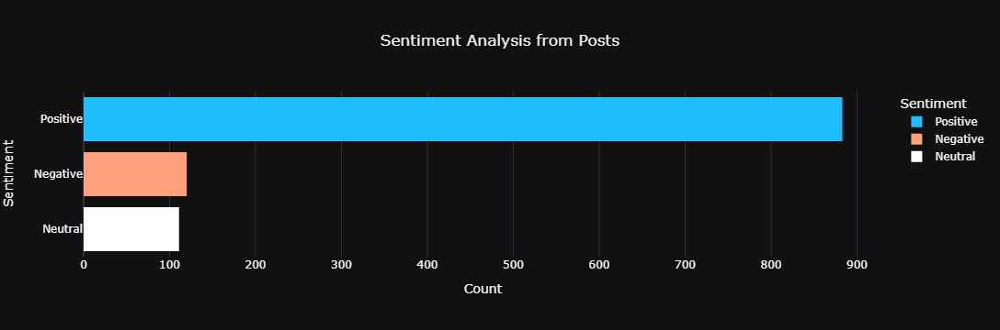

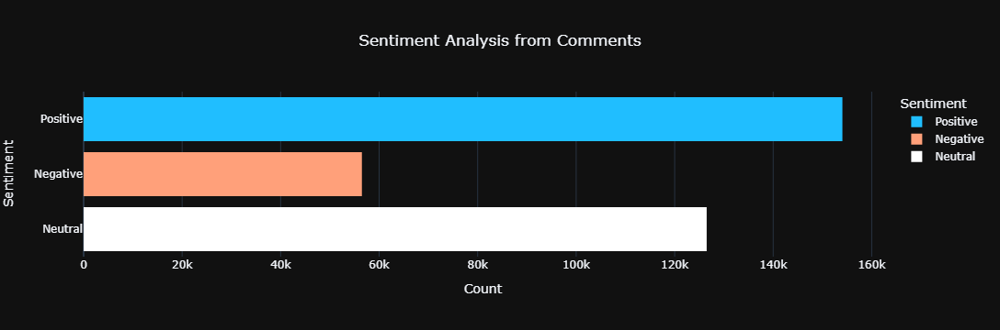

In [59]:
def senti_plot(df, type):
    fig = px.histogram(
        df['class_sentiment'],
        y="class_sentiment",
        title=f'Sentiment Analysis from {type}',
        color='class_sentiment',
        color_discrete_map=custom_colors_map
    )
    fig.update_traces(hovertemplate='%{y}<br>Count: %{x}')
    fig.update_layout(template='plotly_dark', title_x=0.5, yaxis_title='Sentiment', xaxis_title='Count', legend_title='Sentiment')
    fig.show()

senti_plot(data_post, 'Posts')
senti_plot(data_comment, 'Comments')



### Funkcja tags_plot 
Generuje wykres słupkowy, który przedstawia analizę sentymentu dla różnych tagów na podstawie danych z DataFrame'u df. Parametr type określa rodzaj danych przetwarzanych ('Posts' lub 'Comments'). Wykres przedstawia procentowy udział negatywnych, neutralnych i pozytywnych sentymentów dla każdego tagu. Używane są różne kolory dla różnych kategorii sentymentu. Wizualizacja jest wygenerowana przy użyciu biblioteki Plotly i wyświetlana interaktywnie.

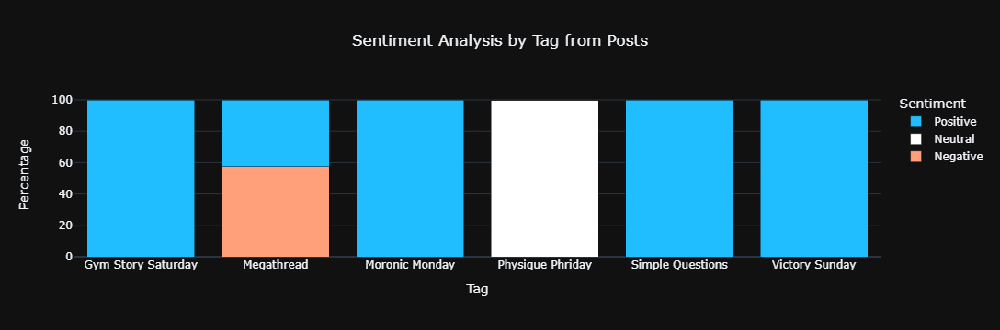

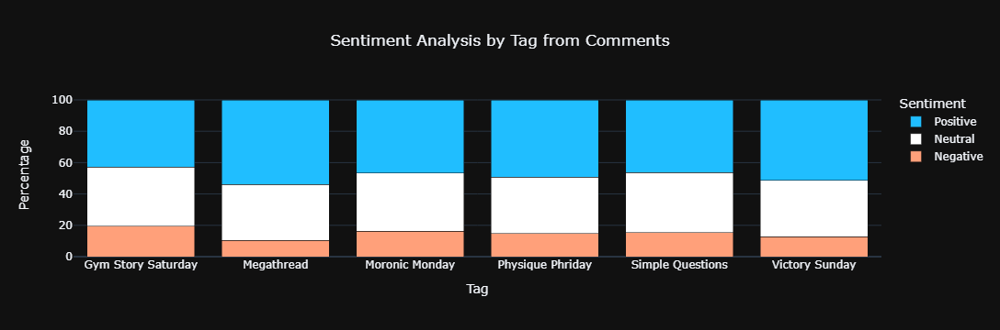

In [60]:
def tags_plot(df, type):
    sentiment_by_tag = df.groupby(['tag', 'class_sentiment']).size().reset_index(name='counts')
    sentiment_by_tag = sentiment_by_tag.pivot(index='tag', columns='class_sentiment', values='counts').reset_index().fillna(0)

    sentiment_by_tag = sentiment_by_tag.reindex(columns=['tag', 'Negative', 'Neutral', 'Positive'], fill_value=0)

    sentiment_by_tag['Total'] = sentiment_by_tag[['Negative', 'Neutral', 'Positive']].sum(axis=1)
    for sentiment in ['Negative', 'Neutral', 'Positive']:
        sentiment_by_tag[sentiment] = (sentiment_by_tag[sentiment] / sentiment_by_tag['Total']) * 100

    fig = px.bar(
        sentiment_by_tag,
        x='tag',
        y=['Negative', 'Neutral', 'Positive'],
        title=f'Sentiment Analysis by Tag from {type}',
        barmode='stack',
        color_discrete_map=custom_colors_map
    )
    fig.update_traces(hovertemplate='%{x}<br>Percentage: %{y:.2f}')
    fig.update_layout(template='plotly_dark', title_x=0.5, yaxis_title='Percentage', xaxis_title='Tag', legend_title='Sentiment', legend=dict(traceorder='reversed'))
    fig.for_each_trace(lambda t: t.update(name=t.name.title()))
    fig.show()

tags_plot(data_post, 'Posts')
tags_plot(data_comment, 'Comments')


### Funkcja hourly_plot 
Generuje wykres słupkowy przedstawiający godzinową dystrybucję postów lub komentarzy na podstawie danych z DataFrame'u df. Parametr type określa rodzaj danych przetwarzanych ('Posts' lub 'Comments'). Wykres przedstawia liczbę postów lub komentarzy dla każdej godziny w ciągu dnia. Wizualizacja jest wygenerowana przy użyciu biblioteki Plotly i wyświetlana interaktywnie.

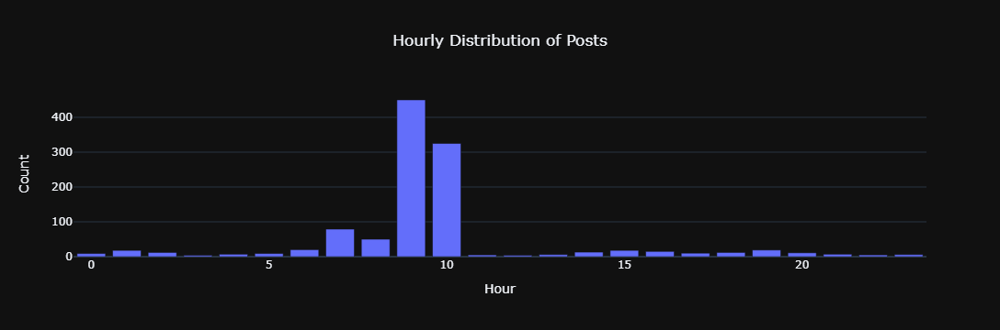

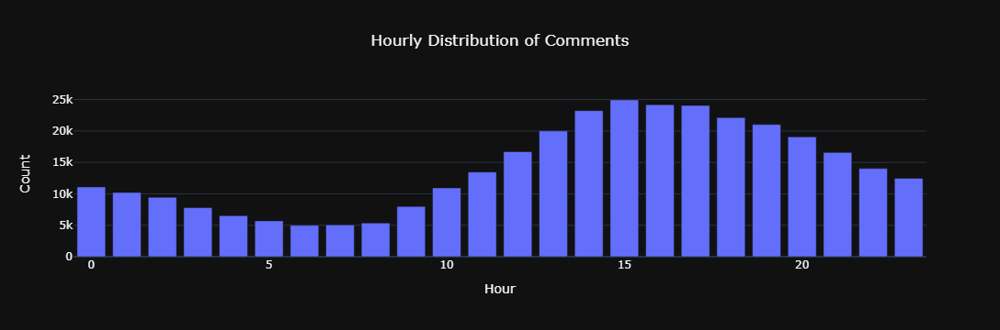

In [61]:
def hourly_plot(df, type):
    # Define the hourly distribution of posts or comments
    hourly_distribution = df.groupby(df['datetime'].dt.hour)['text'].count().reset_index(name='count')

    # Create the plot
    fig = px.bar(hourly_distribution, x='datetime', y='count', labels={'datetime': 'Hour', 'count': 'Count'}, title=f'Hourly Distribution of {type}')
    fig.update_layout(template='plotly_dark', title_x=0.5)
    fig.show()

hourly_plot(data_post, "Posts")
hourly_plot(data_comment, "Comments")


In [62]:
def flatten_list(l):
    return [x for y in l for x in y]

### Funkcja generate_word_clouds 
Generuje chmury słów dla dokumentów związanych z pozytywnym, neutralnym i negatywnym sentymentem. 
Przyjmuje następujące parametry:
- pos_doc: Lista słów związanych z pozytywnym sentymentem.
neu_doc: Lista słów związanych z neutralnym sentymentem.
neg_doc: Lista słów związanych z negatywnym sentymentem.
titles: Lista tytułów dla chmur słów odpowiadających kolejno pozytywnemu, neutralnemu i negatywnemu sentymentowi.
axes: Lista obiektów osi, na których będą wyświetlane chmury słów.

Funkcja iteruje po listach dokumentów, funkcji kolorujących i tytułów. Dla każdej kategorii sentymentu generuje chmurę słów za pomocą funkcji generate_word_cloud, łącząc słowa w dokumentach w jedną ciągłą sekwencję. Na koniec, wyświetla wszystkie chmury słów na wykresie, zachowując odpowiednią kolorystykę i tytuły dla każdej z nich.

### Funkcja word_clouds 
Generuje chmury słów dla danych z DataFrame'u df, uwzględniając ich sentyment. Dokumenty są sortowane według wartości sentymentu, a następnie wybierane są 100 najczęściej występujących słów dla każdej kategorii sentymentu: pozytywnego, neutralnego i negatywnego. Słowa są oczyszczane z wyrazów z listy stop-words. Następnie tworzone są listy słów związanych z każdym rodzajem sentymentu: pozytywnym, negatywnym i neutralnym. Jeśli dla kategorii neutralnej brak jest wystarczającej liczby danych, tworzona jest lista jednoelementowa zawierająca underscore. Na końcu, dla każdej kategorii sentymentu generowane są chmury słów za pomocą funkcji generate_word_clouds, a wyniki są wyświetlane na pojedynczym wykresie zawierającym trzy kolumny.

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mplucinska\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


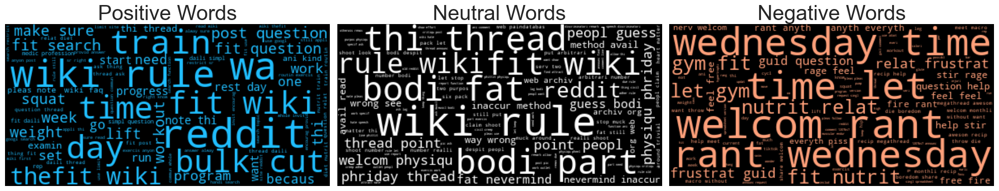

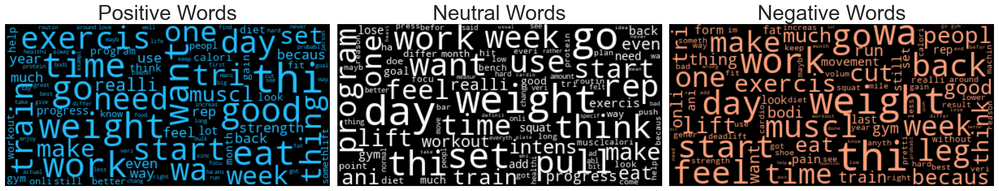

In [66]:
def generate_word_clouds(pos_doc, neu_doc, neg_doc, titles, axes):
    color_funcs = [lambda *args, **kwargs: custom_colors_map["Positive"],
                   lambda *args, **kwargs: custom_colors_map["Neutral"],
                   lambda *args, **kwargs: custom_colors_map["Negative"]]

    for i, (doc, color_func, title) in enumerate(zip([pos_doc, neu_doc, neg_doc], color_funcs, titles)):
        generate_word_cloud(" ".join(doc), color_func, title, axes[i])

    plt.tight_layout()
    plt.show()
    
def word_clouds(df):
    sentiment_sorted = df.sort_values('sentiment_eval', ascending=False)
    top_100 = lambda sentiment: sentiment_sorted[sentiment_sorted['class_sentiment'] == sentiment].iloc[:100]
    cleanup = lambda x: [y for y in x if y not in stop_words]

    positive_top_100 = top_100("Positive")
    negative_top_100 = top_100("Negative")
    neutral_top_100 = top_100("Neutral")

    pos_doc = flatten_list(positive_top_100['text'].apply(cleanup))
    neg_doc = flatten_list(negative_top_100['text'].apply(cleanup))
    neu_doc = flatten_list(neutral_top_100['text'].apply(cleanup)) if len(neutral_top_100) > 0 else ['_']

    titles = ["Positive Words", "Neutral Words", "Negative Words"]
    fig, axes = plt.subplots(1, 3, figsize=(20, 10))
    generate_word_clouds(pos_doc, neu_doc, neg_doc, titles, axes)

# Generate word clouds
word_clouds(data_post)
word_clouds(data_comment)
